# Nappe de Morlces, Switzerland

Notebook crated by [Bane Sullivan](https://banesullivan.com)


Download and extract that data from the archive: https://doi.org/10.6084/m9.figshare.c.4130759

> Dataset representing a 3D geological reconstruction of the a section of the Nappe de Morlces, Switzerland. Associated with "A 3D geological model of a structurally complex Alpine region as a basis for interdisciplinary research" (Thornton et al.)

> Thornton, J. M., Mariethoz, G., & Brunner, P. (2018). A 3D geological model of a structurally complex Alpine region as a basis for interdisciplinary research. https://doi.org/10.6084/m9.figshare.6507437.v1

In [1]:
import numpy as np
import PVGeo
import pyvista as pv
import glob
import os
from matplotlib.colors import ListedColormap

In [2]:
# Load poly data surface
path = "Thornton_et_al/Surfaces for ParaView/"
files = [f for f in glob.glob(path + "*.vtp")]

read = lambda f: (os.path.basename(f)[:-4], pv.read(f))
surfaces = pv.MultiBlock(dict([read(f) for f in files]))

surfaces

MultiBlock (0x7fe1b0f01ac8)
  N Blocks:	18
  X Bounds:	570500.000, 580200.000
  Y Bounds:	112400.000, 125800.000
  Z Bounds:	0.000, 3034.728

In [3]:
# colormap
colors = {
    "10_basement": "#d1d1d1",
    "11_a": "#8b5a2b",
    "12_i1i": "#cd853f",
    "13_i1s": "#ee9a49",
    "14_i2": "#deb887",
    "15_i3_4": "#6e8b3d",
    "16_i5": "#5f9ea0",
    "17_i6_8": "#7ac5cd",
    "18_i8c2": "#8fbc8f",
    "19_c2k": "#9acd32",
    "20_c3": "#cd9b1d",
    "21_c4": "#9acd32",
    "22_c4_5": "#548b54",
    "23_c6_8": "#ff6347",
    "24_e5": "#f08080",
    "25_e6c": "#f4a460",
    "26_e6k": "#eedc82",
    "27_e6o1": "#ffff00",
}
assert len(colors.keys()) == surfaces.n_blocks
cmap = ListedColormap(colors.values())
dargs = dict(categories=True, cmap=cmap, clim=[10, 27])

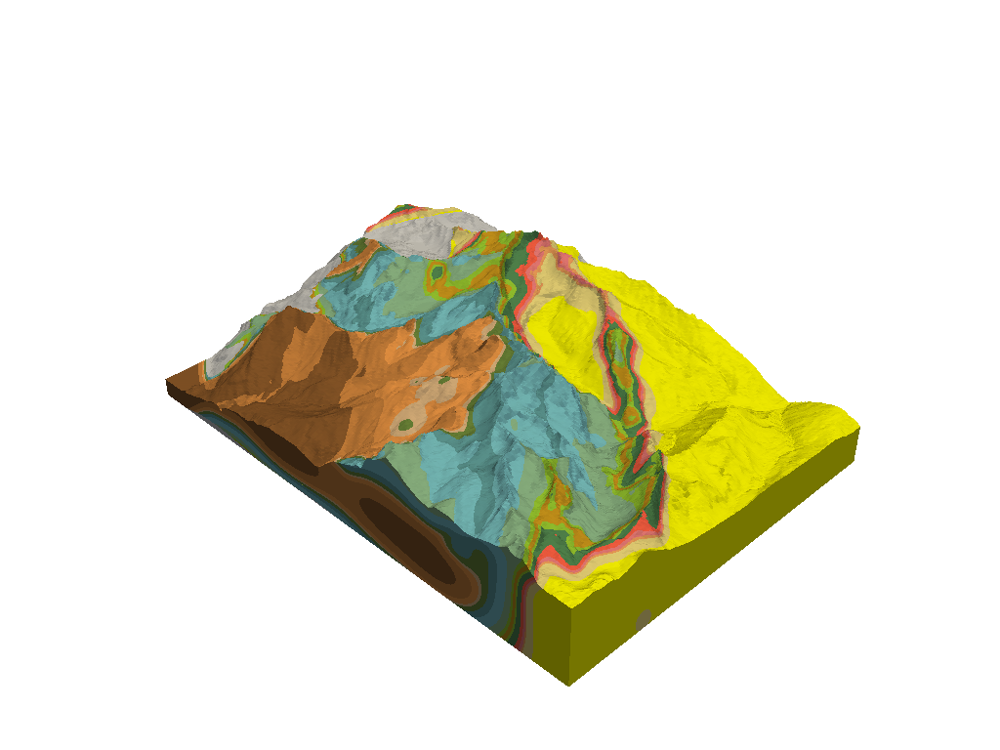

In [4]:
p = pv.Plotter(notebook=1)
for i, surf in enumerate(surfaces):
    name = surfaces.get_block_name(i)
    p.add_mesh(surf, color=colors[name])
p.show()

In [5]:
## Load SGeMS models

# path = "Thornton_et_al/SGeMS voxel format/"
# files = [f for f in glob.glob(path + "*.SGEMS")]

def read_sgems(filename, extent):
    """String filename and (nx,ny,nz) extent"""
    extent = np.append(np.array(extent), 1)
    table = PVGeo.gslib.GSLibReader().apply(filename)
    grid = PVGeo.grids.TableToTimeGrid(extent=extent).apply(table)
    return grid

grid_50 = read_sgems('Thornton_et_al/SGeMS voxel format/50m.SGEMS', (192, 268, 65))
grid_50

UniformGrid (0x7fe191528be8)
  N Cells:	3344640
  N Points:	3426522
  X Bounds:	0.000e+00, 1.920e+02
  Y Bounds:	0.000e+00, 2.680e+02
  Z Bounds:	0.000e+00, 6.500e+01
  Dimensions:	193, 269, 66
  Spacing:	1.000e+00, 1.000e+00, 1.000e+00
  N Arrays:	1

In [6]:
contours = grid_50.threshold(1).ctp().contour(len(colors))

p = pv.Plotter(notebook=1)
p.add_mesh(contours, **dargs)
p.show(use_panel=True, auto_close=False)

VTK(vtkCocoaRenderWindow, height=400, sizing_mode='stretch_width')